# Test validity step 2 : $P(s_c | ...) \propto (s_c - s_{c,WF})^t (C^{-1} + (E^t (B^t N^{-1} B)^{-1} E)^{-1}) (s_c - s_{c,WF})$

In [1]:
import os, sys, time
import numpy as np
import matplotlib.pyplot as plt
from jax import random, dtypes
import jax.numpy as jnp
import jax.scipy as jsp
import jax_healpy as jhp
import scipy
import healpy as hp
import astropy.io.fits as fits
import camb
import numpyro.distributions as dist
import lineax as lx

import micmac as micmac

In [2]:
PRNGKey = random.PRNGKey(0)


In [3]:
sys.path.append(os.path.dirname(os.path.abspath('')))
sys.path.append(os.path.dirname(os.path.dirname(os.path.abspath('')))+'/tutorials/')
from func_tools_for_tests import *
from get_freq_maps_SO_64 import *
# freq_maps is defined there

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Shape for input frequency maps : (6, 2, 49152)
Shape for input cmb maps : (6, 2, 49152)


In [4]:
instrument

,frequency,depth_p,depth_i,fwhm,f_sky,status,reference,type,note,experiment
0,27.0,49.5,35.0,91.0,0.1,forecast,Journal of Cosmology and Astroparticle Physics...,ground,depth_p is simply depth_i * sqrt(2),SO_SAT
1,39.0,29.7,21.0,63.0,0.1,forecast,Journal of Cosmology and Astroparticle Physics...,ground,depth_p is simply depth_i * sqrt(2),SO_SAT
2,93.0,3.7,2.6,30.0,0.1,forecast,Journal of Cosmology and Astroparticle Physics...,ground,depth_p is simply depth_i * sqrt(2),SO_SAT
3,145.0,4.7,3.3,17.0,0.1,forecast,Journal of Cosmology and Astroparticle Physics...,ground,depth_p is simply depth_i * sqrt(2),SO_SAT
4,225.0,8.9,6.3,11.0,0.1,forecast,Journal of Cosmology and Astroparticle Physics...,ground,depth_p is simply depth_i * sqrt(2),SO_SAT
5,280.0,22.6,16.0,9.0,0.1,forecast,Journal of Cosmology and Astroparticle Physics...,ground,depth_p is simply depth_i * sqrt(2),SO_SAT


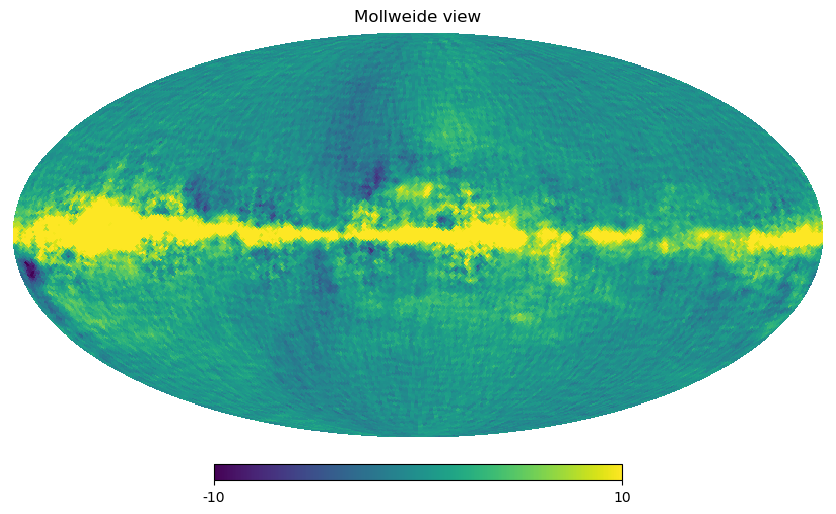

In [5]:
hp.mollview(freq_maps[2,0], min=-10, max=10) # Freq, nstokes, npix

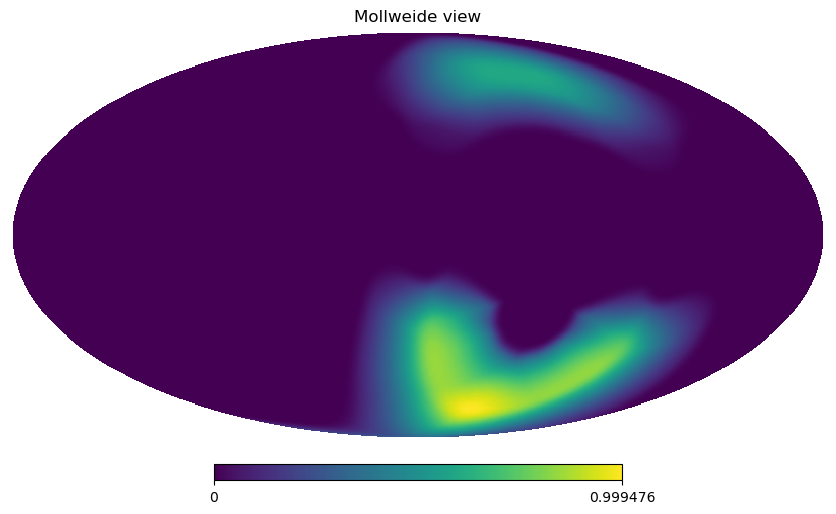

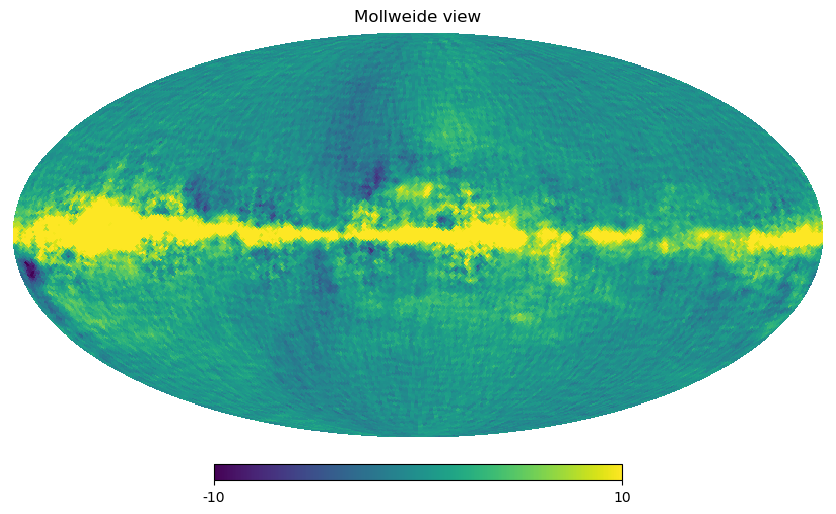

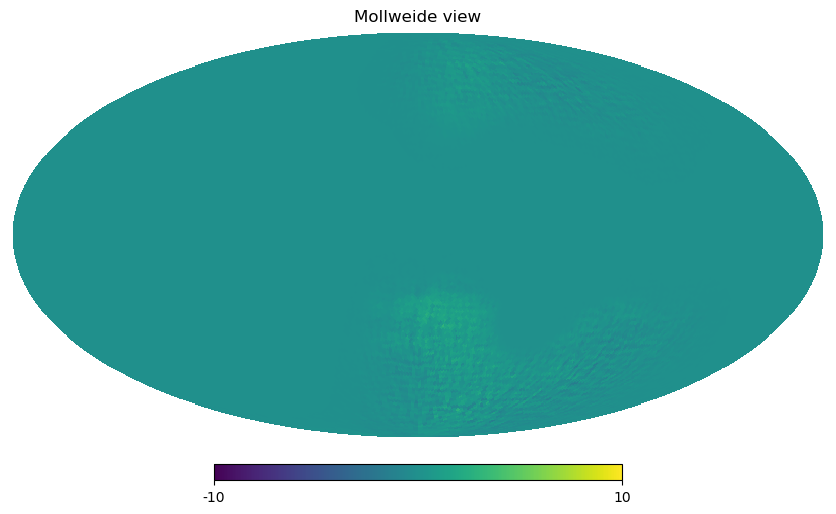

In [6]:
path_mask_test = "/Users/mag/Documents/PHD1Y/Masks/mask_SAT_apodized.fits"

mask_test = hp.read_map(path_mask_test)
hp.mollview(mask_test)
hp.mollview(freq_maps[2,0], min=-10, max=10) # Freq, nstokes, npixhp.mollview(freq_maps[0,0]) # Freq, nstokes, npix
hp.mollview(freq_maps[2,0]*hp.ud_grade(mask_test,nside_out=64), min=-10, max=10) # Freq, nstokes, npix

In [7]:
# working_directory_path = os.path.abspath('') + '/'
working_directory_path = '/Users/mag/Documents/PHD1Y/Space_Work/Pixel_non_P2D/MICMAC/test_playground/validation_chain_v5/'
directory_save_file = working_directory_path + 'save_directory/'
directory_toml_file = working_directory_path + 'toml_params/'

# path_toml_file = directory_toml_file + 'test_full_chain_v1a.toml'
# path_toml_file = directory_toml_file + 'test_classical_chain_v1a.toml'
# path_toml_file = directory_toml_file + 'test_full_chain_v1d.toml'
# path_toml_file = directory_toml_file + 'corr_full_chain_v3a.toml'
# path_toml_file = directory_toml_file + 'biased_full_chain_v1a.toml'
# path_toml_file = directory_toml_file + 'biased_full_chain_v1b.toml'
path_toml_file = directory_toml_file + 'biased_full_chain_v1cc.toml'
path_toml_file = directory_toml_file + 'biased_full_chain_v1cd.toml'
path_toml_file = directory_toml_file + 'biased_full_chain_v1d.toml'


In [8]:
MICMAC_sampler_obj = micmac.create_MICMAC_sampler_from_toml_file(path_toml_file)

In [9]:
reduction_noise = 1

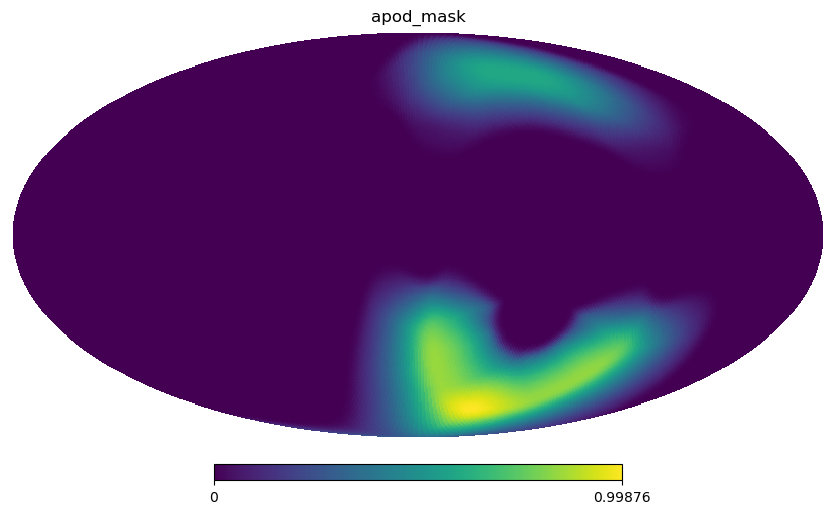

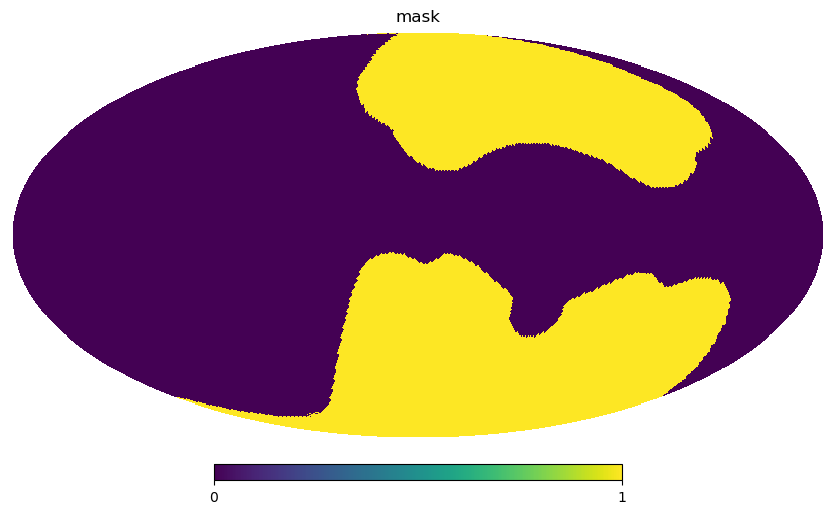

In [10]:
path_mask = "/Users/mag/Documents/PHD1Y/Masks/mask_SAT_apodized.fits"

relative_treshold = 1e-1

apod_mask = hp.ud_grade(hp.read_map(path_mask_test),nside_out=MICMAC_sampler_obj.nside)
mask = np.copy(apod_mask)

# nhits_mask = np.copy(apod_mask)
# # nhits_mask = np.copy(mask)
# nhits_mask[nhits_mask<relative_treshold] = 0

# # nhits_mask[nhits_mask>0] = mask[mask>0]

# inverse_nhits_mask = np.copy(nhits_mask)
# inverse_nhits_mask[nhits_mask>0] = 1/nhits_mask[nhits_mask>0]

# mask[nhits_mask>0] = 1
# mask[nhits_mask==0] = 0

mask[apod_mask>0] = 1

hp.mollview(apod_mask, title='apod_mask')
# hp.mollview(nhits_mask, title='nhits_mask')
# hp.mollview(inverse_nhits_mask, title='inverse_nhits_mask')
hp.mollview(mask, title='mask')


In [11]:
# mask = np.ones(MICMAC_sampler_obj.npix)

MICMAC_sampler_obj.mask = jnp.array(mask)

In [12]:
# freq_inverse_noise = micmac.get_noise_covar(instrument['depth_p']/reduction_noise, MICMAC_sampler_obj.nside)
freq_inverse_noise_0 = micmac.get_noise_covar(instrument['depth_p'], MICMAC_sampler_obj.nside) #MICMAC_sampler_obj.freq_inverse_noise

freq_inverse_noise_masked = np.zeros((MICMAC_sampler_obj.number_frequencies,MICMAC_sampler_obj.number_frequencies,MICMAC_sampler_obj.npix))

nb_pixels_mask = int(mask.sum())
freq_inverse_noise_masked[:,:,mask!=0] = np.repeat(freq_inverse_noise_0.ravel(order='F'), nb_pixels_mask).reshape((MICMAC_sampler_obj.number_frequencies,MICMAC_sampler_obj.number_frequencies,nb_pixels_mask), order='C')

freq_inverse_noise_masked = freq_inverse_noise_masked*mask
# freq_inverse_noise_masked = freq_inverse_noise_masked*nhits_mask

MICMAC_sampler_obj.freq_inverse_noise = freq_inverse_noise_masked
freq_inverse_noise = freq_inverse_noise_masked

In [13]:
instrument = get_instrument(instr_name)

instrument['depth_p'] /= reduction_noise
# get input freq maps
# np.random.seed(noise_seed)
# freq_maps_fgs_noised = get_observation(instrument, fgs_model, nside=MICMAC_sampler_obj.nside, noise=True)[:, 1:, :]   # keep only Q and U
# np.random.seed(noise_seed)
# freq_maps_fgs_denoised = get_observation(instrument, fgs_model, nside=MICMAC_sampler_obj.nside, noise=False)[:, 1:, :]   # keep only Q and U

# noise_map = freq_maps_fgs_noised - freq_maps_fgs_denoised
# reweighted_noise_map = noise_map / nhits_mask
# reweighted_noise_map = noise_map * jnp.sqrt(inverse_nhits_mask)

# freq_maps_fgs = freq_maps_fgs_denoised + reweighted_noise_map

np.random.seed(noise_seed)
freq_maps_fgs = get_observation(instrument, fgs_model, nside=MICMAC_sampler_obj.nside, noise=False)[:, 1:, :]   # keep only Q and U

In [14]:
indices_polar = np.array([1,2,4])
partial_indices_polar = indices_polar[:MICMAC_sampler_obj.nstokes]

In [15]:
init_mixing_matrix_obj = micmac.InitMixingMatrix(np.array(instrument['frequency']), MICMAC_sampler_obj.number_components, pos_special_freqs=MICMAC_sampler_obj.pos_special_freqs)
init_params = init_mixing_matrix_obj.init_params()

mixing_matrix_obj = micmac.MixingMatrix(instrument['frequency'], MICMAC_sampler_obj.number_components, init_params, pos_special_freqs=MICMAC_sampler_obj.pos_special_freqs)

mixing_matrix_sampled = mixing_matrix_obj.get_B()

BtinvNB = micmac.get_inv_BtinvNB(freq_inverse_noise, mixing_matrix_sampled)#*mask
# BtinvN_sqrt = micmac.get_BtinvN(scipy.linalg.sqrtm(freq_inverse_noise), mixing_matrix_sampled)#*mask
BtinvN_sqrt = micmac.get_BtinvN(np.sqrt(freq_inverse_noise), mixing_matrix_sampled)#*mask

BtinvN = micmac.get_BtinvN(freq_inverse_noise, mixing_matrix_sampled)#*mask

nb_pix_mask = int(np.sum(mask))


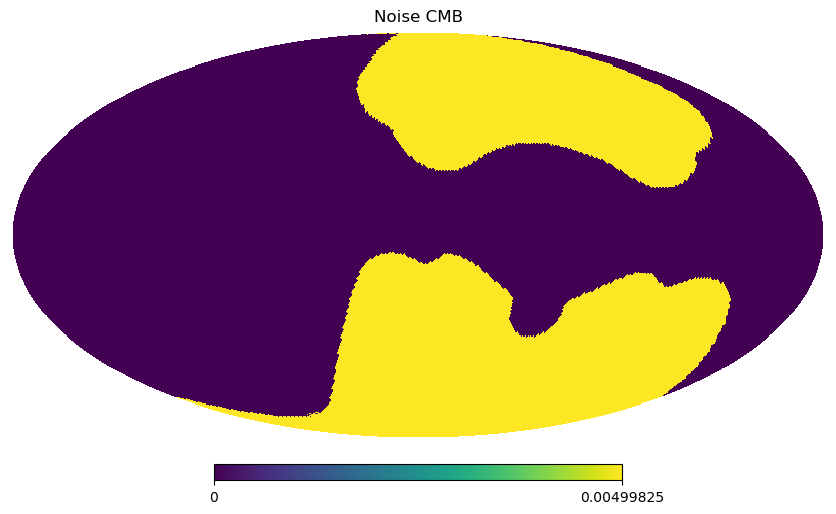

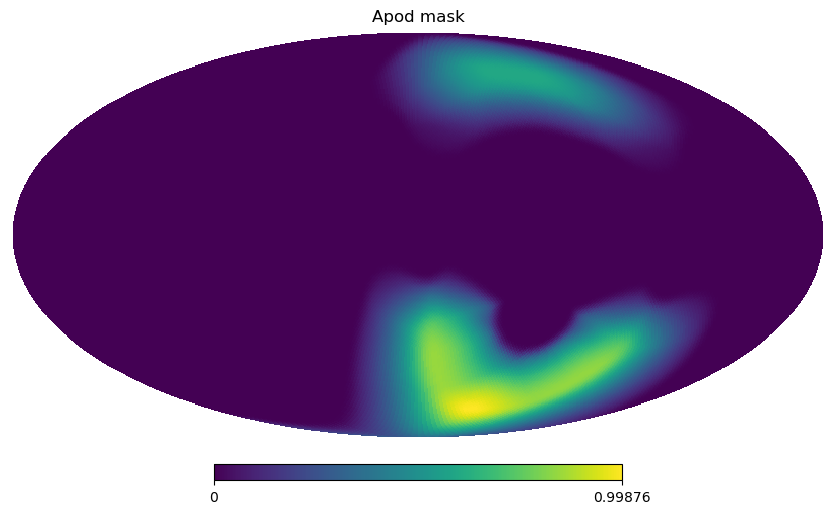

In [16]:
hp.mollview(BtinvNB[0,0], title='Noise CMB')
hp.mollview(apod_mask, title='Apod mask')

In [17]:
input_freq_maps, input_cmb_maps, theoretical_red_cov_r0_total, theoretical_red_cov_r1_tensor = MICMAC_sampler_obj.generate_input_freq_maps_from_fgs(freq_maps_fgs, return_only_freq_maps=False)

input_freq_maps_masked = input_freq_maps*mask
input_cmb_maps = input_cmb_maps*mask

Calculating spectra from CAMB !
Calculating spectra from CAMB !


In [18]:
s_cML = micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, input_freq_maps_masked, jax_use=False)[0, :, :]

In [19]:
red_cov_matrix_sample = theoretical_red_cov_r0_total + MICMAC_sampler_obj.r_true * theoretical_red_cov_r1_tensor

In [20]:
number_frequencies = MICMAC_sampler_obj.number_frequencies
number_components = MICMAC_sampler_obj.number_components
nstokes = MICMAC_sampler_obj.nstokes
lmin = MICMAC_sampler_obj.lmin
lmax = MICMAC_sampler_obj.lmax
nside = MICMAC_sampler_obj.nside
n_iter = MICMAC_sampler_obj.n_iter
npix = 12*nside**2

In [21]:
MICMAC_sampler_obj.tolerance_CG = 1e-6
MICMAC_sampler_obj.atol_CG = 1e-8

In [22]:
MICMAC_sampler_obj.limit_iter_cg = 1500

In [23]:
N_c_inv = jnp.copy(BtinvNB[0,0])
N_c_inv = N_c_inv.at[...,MICMAC_sampler_obj.mask!=0].set(1/BtinvNB[0,0,MICMAC_sampler_obj.mask!=0]/jhp.nside2resol(MICMAC_sampler_obj.nside)**2)
N_c_inv_repeat = jnp.repeat(N_c_inv.ravel(order='C'), MICMAC_sampler_obj.nstokes).reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix), order='F').ravel()

def second_term_left(x):
    return x*N_c_inv_repeat

red_cov_matrix_sqrt = micmac.get_sqrt_reduced_matrix_from_matrix_jax(red_cov_matrix_sample)
first_part_term_left = lambda x : maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), red_cov_matrix_sqrt, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()

# func = lambda x: maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), red_cov_matrix_sample, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()
func = lambda x: x.ravel() + first_part_term_left(second_term_left(first_part_term_left(x)))
# func_left_term_tree_map = lambda x : jax.tree_map(func, x)
func_norm = lambda x : jnp.linalg.norm(x,ord=2)

CG_solver = lx.CG(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm)

# func_lineax_test = lx.FunctionLinearOperator(func, jax.ShapeDtypeStruct((MICMAC_sampler_obj.nstokes*MICMAC_sampler_obj.npix,),jnp.float64), tags=(lx.symmetric_tag,lx.positive_semidefinite_tag))
func_lineax_test = lx.FunctionLinearOperator(func, jax.ShapeDtypeStruct((MICMAC_sampler_obj.nstokes*MICMAC_sampler_obj.npix,),jnp.float64), tags=(lx.symmetric_tag,lx.positive_semidefinite_tag))
# func_lineax_test = lx.FunctionLinearOperator(func_left_term_tree_map, 
#                                         {'Fluct':jax.ShapeDtypeStruct((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix,),jnp.float64),
#                                          'WF':jax.ShapeDtypeStruct((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix,),jnp.float64)}, 
#                                         tags=(lx.symmetric_tag,lx.positive_semidefinite_tag))
# multi_linear_solve = jax.vmap(lx.linear_solve)
solution = lx.linear_solve(func_lineax_test, s_cML.ravel(), solver=CG_solver, throw=False)
# solution = lx.linear_solve(func_lineax_test, s_cML.ravel(), throw=False)
print(solution.stats)

solution_lineax = solution.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))

{'max_steps': 1500, 'num_steps': Array(201, dtype=int64)}


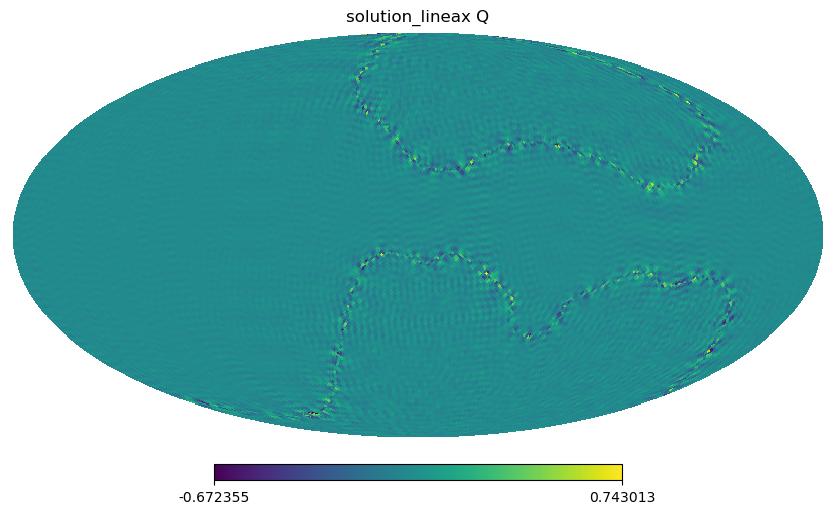

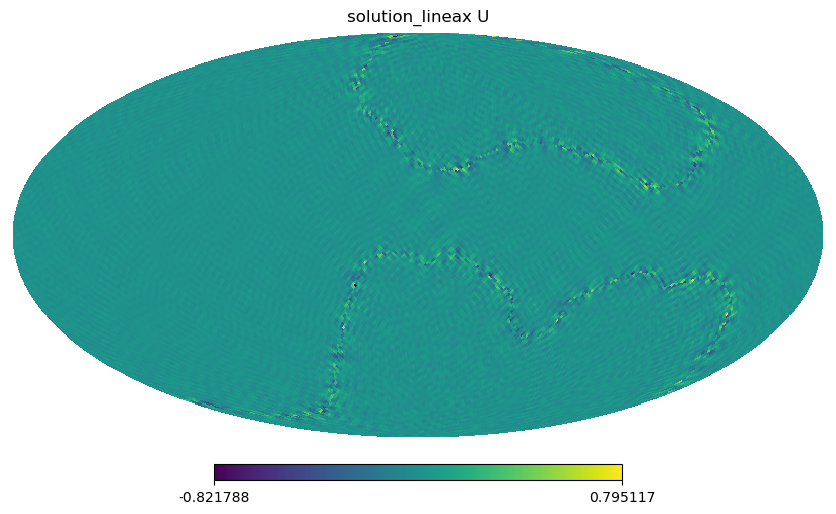

In [24]:
hp.mollview(solution_lineax[0], title='solution_lineax Q')
hp.mollview(solution_lineax[1], title='solution_lineax U')

In [25]:
# func_lineax_test = lx.FunctionLinearOperator(func, jax.ShapeDtypeStruct((MICMAC_sampler_obj.nstokes*MICMAC_sampler_obj.npix,),jnp.float64), tags=(lx.symmetric_tag,lx.positive_semidefinite_tag))
# func_lineax_test_2 = lx.linearise(func_lineax_test)

In [26]:
# MICMAC_sampler_obj.atol_CG = 1e-6
# MICMAC_sampler_obj.tolerance_CG = 1e-6

In [27]:
func_norm_masked = lambda x : jnp.linalg.norm((x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))*mask).ravel(),ord=2)

In [28]:
GMRES_solver = lx.GMRES(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm)
# GMRES_solver = lx.GMRES(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm_masked)
solution_5 = lx.linear_solve(func_lineax_test, s_cML.ravel(), solver=GMRES_solver, throw=False)
solution_5.stats


{'max_steps': 1500, 'num_steps': Array(15, dtype=int64)}

In [29]:
(solution_5.value - solution.value).mean(), jnp.abs(solution_5.value - solution.value).max()

(Array(-6.45086175e-14, dtype=float64), Array(1.36013534e-10, dtype=float64))

In [30]:
@jax.custom_jvp
def f(x, y):
  return jnp.sin(x) * y

# f.nondiff_argnums = (2,)

@f.defjvp
def f_jvp(primals, tangents):
  x, y = primals
  x_dot, y_dot = tangents
  primal_out = f(x, y)
  tangent_out = jnp.cos(x) * x_dot * y + jnp.sin(x) * y_dot
  return primal_out, tangent_out

In [31]:
print(f(2., 3.))
y, y_dot = jax.jvp(f, (2., 3.), (1., 0.))
print(y)
print(y_dot)
print(jax.grad(f)(2., 3.))

2.727892280477045
2.727892280477045
-1.2484405096414273
-1.2484405096414273


In [32]:
@jax.custom_jvp
def func_to_solve(input_map, args=None):
    # BtinvNB = args['BtinvNB']
    # red_cov_matrix_sample = args['red_cov_matrix_sample']
    # N_c_inv = jnp.copy(BtinvNB[0,0])
    # N_c_inv = N_c_inv.at[...,MICMAC_sampler_obj.mask!=0].set(1/BtinvNB[0,0,MICMAC_sampler_obj.mask!=0]/jhp.nside2resol(MICMAC_sampler_obj.nside)**2)
    N_c_inv = jnp.where(MICMAC_sampler_obj.mask!=0, 1/BtinvNB[0,0]/(jhp.nside2resol(MICMAC_sampler_obj.nside)**2), 0)

    N_c_inv_repeat = jnp.repeat(N_c_inv.ravel(order='C'), MICMAC_sampler_obj.nstokes).reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix), order='F').ravel()

    def second_term_left(x):
        return x*N_c_inv_repeat

    red_cov_matrix_sqrt = micmac.get_sqrt_reduced_matrix_from_matrix_jax(red_cov_matrix_sample)
    first_part_term_left = lambda x : maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), red_cov_matrix_sqrt, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()

    # func = lambda x: maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), red_cov_matrix_sample, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()
    return input_map.ravel() + first_part_term_left(second_term_left(first_part_term_left(input_map.ravel())))

# jv_WF = jax.custom_jvp(func_to_solve, nondiff_argnums=(1,2))

func_to_solve.nondiff_argnums = (1,)

@func_to_solve.defjvp
def func_to_solve_jvp(args, primals, tangents):
    print("Test",primals, args, tangents, flush=True)
    input_map = primals[0]
    input_map_dot = tangents[0]

    # N_c_inv = jnp.copy(BtinvNB[0,0])
    # N_c_inv = N_c_inv.at[...,MICMAC_sampler_obj.mask!=0].set(1/BtinvNB[0,0,MICMAC_sampler_obj.mask!=0]/jhp.nside2resol(MICMAC_sampler_obj.nside)**2)
    # N_c_inv_repeat = jnp.repeat(N_c_inv.ravel(order='C'), MICMAC_sampler_obj.nstokes).reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix), order='F').ravel()

    # def second_term_left(x):
    #     return x*N_c_inv_repeat

    # red_cov_matrix_sqrt = micmac.get_sqrt_reduced_matrix_from_matrix_jax(red_cov_matrix_sample)
    # first_part_term_left = lambda x : maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), red_cov_matrix_sqrt, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()

    # func = lambda x: maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), red_cov_matrix_sample, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()
    return func_to_solve(input_map), func_to_solve(input_map_dot)

In [33]:
jax.jvp(jax.numpy.sin, (0.1,), (0.2,))

(Array(0.09983342, dtype=float64, weak_type=True),
 Array(0.19900083, dtype=float64, weak_type=True))

In [34]:
jnp.sin(.1), jnp.cos(.1)*.2

(Array(0.09983342, dtype=float64, weak_type=True),
 Array(0.19900083, dtype=float64, weak_type=True))

In [35]:
jax.jvp(lambda x:5*x, (0.1,), (0.2,))

(Array(0.5, dtype=float64, weak_type=True),
 Array(1., dtype=float64, weak_type=True))

In [36]:
Jacobian_op = lx.JacobianLinearOperator(fn=func_to_solve, x=s_cML.ravel(), tags=(lx.symmetric_tag,lx.positive_semidefinite_tag))

GMRES_solver = lx.GMRES(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm)
solution_5 = lx.linear_solve(Jacobian_op, s_cML.ravel(), solver=GMRES_solver, throw=False)
solution_5.stats


Test (Traced<ShapedArray(float64[98304])>with<DynamicJaxprTrace(level=1/0)>,) None (Traced<ShapedArray(float64[98304])>with<DynamicJaxprTrace(level=1/0)>,)


/var/folders/f8/p6tqlgxj2qn5x_tyjrvc1vnh0000gn/T/ipykernel_41642/2205277479.py:7: RuntimeWarning: divide by zero encountered in divide
  N_c_inv = jnp.where(MICMAC_sampler_obj.mask!=0, 1/BtinvNB[0,0]/(jhp.nside2resol(MICMAC_sampler_obj.nside)**2), 0)


{'max_steps': 1500, 'num_steps': Array(15, dtype=int64)}

In [37]:
solution_J = lx.linear_solve(Jacobian_op, s_cML.ravel(), solver=CG_solver, throw=False)
solution_J.stats


{'max_steps': 1500, 'num_steps': Array(201, dtype=int64)}

In [38]:
solution_0 = lx.linear_solve(func_lineax_test, s_cML.ravel(), solver=CG_solver, throw=False)
solution_0.stats

{'max_steps': 1500, 'num_steps': Array(201, dtype=int64)}

In [39]:
CG_solver_2 = lx.CG(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm, stabilise_every=100)
solution_T = lx.linear_solve(func_lineax_test, s_cML.ravel(), solver=CG_solver_2, throw=False)
solution_T.stats

{'max_steps': 1500, 'num_steps': Array(201, dtype=int64)}

In [40]:
solution_5_lineax = solution_5.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))

In [41]:
# GMRES_solver = lx.GMRES(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm)
# solution_5 = lx.linear_solve(func_lineax_test_2, s_cML.ravel(), solver=GMRES_solver, throw=False)
# solution_5.stats


In [42]:
full_c_ells = np.zeros((6,MICMAC_sampler_obj.lmax+1))
full_c_ells[indices_polar, lmin:]  = micmac.get_c_ells_from_red_covariance_matrix(red_cov_matrix_sample)

map_c_ells = hp.synfast(full_c_ells, nside=MICMAC_sampler_obj.nside, lmax=MICMAC_sampler_obj.lmax, new=True)[1:]
pixel_covariance_diag = (jnp.einsum('sp,sp->sp', map_c_ells, map_c_ells) - map_c_ells.mean()**2)#*jhp.nside2resol(MICMAC_sampler_obj.nside)**2
pixel_covariance_diag = pixel_covariance_diag.at[pixel_covariance_diag<0].set(0)
pixel_covariance_diag_ravel = pixel_covariance_diag.ravel(order='C')
# pixel_covariance_diag_repeat = jnp.repeat(pixel_covariance_diag.ravel(order='C'), MICMAC_sampler_obj.nstokes).reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix), order='F').ravel()

attempt_precond = lambda x: pixel_covariance_diag_ravel

In [43]:
attempt_precond_lineax = lx.FunctionLinearOperator(attempt_precond, jax.ShapeDtypeStruct((MICMAC_sampler_obj.nstokes*MICMAC_sampler_obj.npix,),jnp.float64), tags=(lx.symmetric_tag,lx.positive_semidefinite_tag))

small_perturbation = solution_5b.value + jax.random.uniform(PRNGKey ,minval=-1, maxval=1, shape=(MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)).ravel()/hp.nside2resol(MICMAC_sampler_obj.nside)
options_dict = {'y0':small_perturbation}
GMRES_solver = lx.GMRES(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm)
solution_5b = lx.linear_solve(func_lineax_test, s_cML.ravel(), solver=GMRES_solver, throw=False, options=options_dict)
solution_5b.stats


NameError: name 'solution_5b' is not defined

In [43]:
attempt_precond_lineax = lx.FunctionLinearOperator(attempt_precond, jax.ShapeDtypeStruct((MICMAC_sampler_obj.nstokes*MICMAC_sampler_obj.npix,),jnp.float64), tags=(lx.symmetric_tag,lx.positive_semidefinite_tag))

# options_dict = {'preconditoner':attempt_precond_lineax}
options_dict = {'y0':small_perturbation}

solution_5b = lx.linear_solve(func_lineax_test, s_cML.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5b.stats


NameError: name 'small_perturbation' is not defined

In [44]:
jax_key_PNRG, jax_key_PNRG_xi = random.split(PRNGKey+10) # Splitting of the random key to generate a new one

map_random_realization_xi = jax.random.normal(jax_key_PNRG_xi, shape=(MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))/jhp.nside2resol(MICMAC_sampler_obj.nside)#*mask_to_use

jax_key_PNRG, *jax_key_PNRG_chi = random.split(jax_key_PNRG,MICMAC_sampler_obj.number_frequencies+1) # Splitting of the random key to generate a new one
def fmap(random_key):
    random_map = jax.random.normal(random_key, shape=(MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))#/jhp.nside2resol(nside)
    return MICMAC_sampler_obj.get_band_limited_maps(random_map)
map_random_realization_chi = jax.vmap(fmap)(jnp.array(jax_key_PNRG_chi))

right_member_1 = map_random_realization_xi

N_c_inv = jnp.copy(BtinvNB[0,0])
N_c_inv = N_c_inv.at[...,MICMAC_sampler_obj.mask!=0].set(1/BtinvNB[0,0,MICMAC_sampler_obj.mask!=0]/jhp.nside2resol(MICMAC_sampler_obj.nside)**2)
N_c_inv_repeat = jnp.repeat(N_c_inv.ravel(order='C'), MICMAC_sampler_obj.nstokes).reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix), order='F').ravel()

## Computation of N_c^{-1/2} = (E^t (B^t N^{-1} B)^{-1} E) E^t (B^t N^{-1} B)^{-1} B^t N^{-1/2} chi
right_member_2_part = jnp.einsum('kcp,cfp,fsp->ksp', BtinvNB, BtinvN_sqrt, map_random_realization_chi)[0]*N_c_inv # [0] for selecting CMB component of the random variable
right_member_2 = maps_x_red_covariance_cell_JAX(right_member_2_part, red_cov_matrix_sqrt, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter)

right_member_b = (right_member_1 + right_member_2)#.ravel()
# options_dict = {'preconditoner':attempt_precond_lineax}
right_member_b = MICMAC_sampler_obj.get_band_limited_maps(right_member_b)


In [45]:
jax_key_PNRG, jax_key_PNRG_xi = random.split(PRNGKey) # Splitting of the random key to generate a new one

map_random_realization_xi = jax.random.normal(jax_key_PNRG_xi, shape=(MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))/jhp.nside2resol(MICMAC_sampler_obj.nside)#*mask_to_use

jax_key_PNRG, *jax_key_PNRG_chi = random.split(jax_key_PNRG,MICMAC_sampler_obj.number_frequencies+1) # Splitting of the random key to generate a new one
def fmap(random_key):
    random_map = jax.random.normal(random_key, shape=(MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))#/jhp.nside2resol(nside)
    return MICMAC_sampler_obj.get_band_limited_maps(random_map)
map_random_realization_chi = jax.vmap(fmap)(jnp.array(jax_key_PNRG_chi))

right_member_1 = map_random_realization_xi

N_c_inv = jnp.copy(BtinvNB[0,0])
N_c_inv = N_c_inv.at[...,MICMAC_sampler_obj.mask!=0].set(1/BtinvNB[0,0,MICMAC_sampler_obj.mask!=0]/jhp.nside2resol(MICMAC_sampler_obj.nside)**2)
N_c_inv_repeat = jnp.repeat(N_c_inv.ravel(order='C'), MICMAC_sampler_obj.nstokes).reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix), order='F').ravel()

## Computation of N_c^{-1/2} = (E^t (B^t N^{-1} B)^{-1} E) E^t (B^t N^{-1} B)^{-1} B^t N^{-1/2} chi
right_member_2_part = jnp.einsum('kcp,cfp,fsp->ksp', BtinvNB, BtinvN_sqrt, map_random_realization_chi)[0]*N_c_inv # [0] for selecting CMB component of the random variable
right_member_2 = maps_x_red_covariance_cell_JAX(right_member_2_part, red_cov_matrix_sqrt, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter)

right_member = (right_member_1 + right_member_2)#.ravel()
# options_dict = {'preconditoner':attempt_precond_lineax}
right_member = MICMAC_sampler_obj.get_band_limited_maps(right_member)

noise_c_ell = micmac.get_Cl_noise_JAX(jnp.array(instrument['depth_p']), mixing_matrix_sampled, MICMAC_sampler_obj.lmax)[0,0]
red_noise_c_ell = micmac.get_reduced_matrix_from_c_ell_jax(jnp.array([noise_c_ell, noise_c_ell, jnp.zeros_like(noise_c_ell)]))
red_noise_c_ell_sqrt = micmac.get_sqrt_reduced_matrix_from_matrix_jax(red_noise_c_ell)
harmonic_solution = jnp.linalg.pinv(jnp.eye(MICMAC_sampler_obj.nstokes) + jnp.einsum('lki,lij,ljm->lkm', red_cov_matrix_sqrt, jnp.linalg.pinv(red_noise_c_ell[lmin:]), red_cov_matrix_sqrt))
# harmonic_solution = jnp.linalg.pinv(jnp.einsum('lki,lij,ljm->lkm', red_cov_matrix_sqrt, red_noise_c_ell[lmin:], red_cov_matrix_sqrt))
# harmonic_solution = jnp.eye(MICMAC_sampler_obj.nstokes) + jnp.einsum('lki,lim->lkm', red_cov_matrix_sqrt, red_noise_c_ell_sqrt[lmin:])
# harmonic_solution = jnp.eye(MICMAC_sampler_obj.nstokes) - jnp.einsum('lki,lij,ljm->lkm', red_cov_matrix_sqrt, red_noise_c_ell[lmin:], red_cov_matrix_sqrt)

harmonic_solution_C_half = jnp.einsum('lij,ljk->lik', red_cov_matrix_sqrt, harmonic_solution)
harmonic_solution_C_half_T = jnp.einsum('lij,ljk->lik', harmonic_solution, red_cov_matrix_sqrt)


application_harm_solution = lambda x: maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), harmonic_solution, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()
application_harm_solution_C_half = lambda x: maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), harmonic_solution_C_half, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()
application_harm_solution_C_half_T = lambda x: maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), harmonic_solution_C_half_T, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()

application_inverse_noise = lambda x: maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), jnp.linalg.pinv(red_noise_c_ell[lmin:]), nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()

mask_repeat = jnp.repeat(MICMAC_sampler_obj.mask.ravel(order='C'), MICMAC_sampler_obj.nstokes).reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix), order='F').ravel()

def application_pixel_solution(x):
    return x*N_c_inv_repeat - application_inverse_noise(x)
    # return x*N_c_inv_repeat - x*N_c_inv_repeat[0]
    # return x*N_c_inv_repeat - application_inverse_noise(x)*mask_repeat
first_order_pert_func = lambda x: -application_harm_solution_C_half_T(application_pixel_solution(application_harm_solution_C_half(x)))
first_order_pert = - application_harm_solution_C_half_T(application_pixel_solution(application_harm_solution_C_half(right_member.ravel()))).ravel()

application_C_half = lambda x: maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), red_cov_matrix_sqrt, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter).ravel()
true_correction = lambda x: application_C_half(application_pixel_solution(application_harm_solution_C_half(x))).ravel()

start = micmac.maps_x_red_covariance_cell_JAX(right_member, harmonic_solution, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter)

start_2 = start.ravel() + first_order_pert
start_func = lambda x: application_harm_solution(x) + first_order_pert_func(x)

In [46]:
options_dict = {'y0':start_2.ravel()}

solution_5c = lx.linear_solve(func_lineax_test, right_member_b.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5c.stats


{'max_steps': 1500, 'num_steps': Array(224, dtype=int64)}

In [47]:
previous_solution = solution_5c.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))
new_start = micmac.maps_x_red_covariance_cell_JAX(previous_solution, jnp.linalg.pinv(red_cov_matrix_sqrt), nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter)

options_dict = {'y0':previous_solution.ravel()}


solution_5b = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5b.stats

{'max_steps': 1500, 'num_steps': Array(222, dtype=int64)}

In [48]:
options_dict = {'y0':start_2.ravel()}

solution_5b = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5b.stats


{'max_steps': 1500, 'num_steps': Array(211, dtype=int64)}

In [ ]:
options_dict = {'y0':start_2.ravel()}

solution_5b = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5b.stats


{'max_steps': 1500, 'num_steps': Array(211, dtype=int64)}

In [ ]:
options_dict = {'y0':start_2.ravel()}

solution_5b = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5b.stats


{'max_steps': 1500, 'num_steps': Array(213, dtype=int64)}

In [ ]:
options_dict = {'y0':start_2.ravel()}

solution_5b = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5b.stats


{'max_steps': 1500, 'num_steps': Array(213, dtype=int64)}

In [ ]:
attempt_precond_lineax = lx.FunctionLinearOperator(start_func, jax.ShapeDtypeStruct((MICMAC_sampler_obj.nstokes*MICMAC_sampler_obj.npix,),jnp.float64), tags=(lx.symmetric_tag,lx.positive_semidefinite_tag))
options_dict = {'y0':start_2.ravel(), 'preconditoner':attempt_precond_lineax}

solution_5b = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5b.stats


{'max_steps': 1500, 'num_steps': Array(213, dtype=int64)}

In [ ]:
options_dict = {'y0':start.ravel()}

solution_5b = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5b.stats


{'max_steps': 1500, 'num_steps': Array(214, dtype=int64)}

In [ ]:
options_dict = {'y0':right_member.ravel()}

solution_5b = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=CG_solver, throw=False, options=options_dict)
solution_5b.stats


{'max_steps': 1500, 'num_steps': Array(216, dtype=int64)}

In [ ]:
solution_5b = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=CG_solver, throw=False)
solution_5b.stats


{'max_steps': 1500, 'num_steps': Array(217, dtype=int64)}

In [49]:
options_dict = {'y0':start_2.ravel()}

GMRES_solver = lx.GMRES(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm)
solution_5 = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=GMRES_solver, throw=False, options=options_dict)
solution_5.stats


{'max_steps': 1500, 'num_steps': Array(16, dtype=int64)}

In [85]:
options_dict = {'y0':start_2.ravel()}

GMRES_solver = lx.GMRES(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm, restart=50, stagnation_iters=5)
solution_5 = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=GMRES_solver, throw=False, options=options_dict)
solution_5.stats


In [ ]:
solution_5_hp = solution_5.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))
solution_5b_hp = solution_5b.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))

jnp.abs(solution_5_hp-solution_5b_hp).max(), (solution_5_hp-solution_5b_hp).mean()


(Array(1.00143996e-08, dtype=float64), Array(3.60250067e-13, dtype=float64))

In [53]:
solution_5_hp = solution_5.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))
solution_5b_hp = solution_5b.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))

jnp.abs(solution_5_hp-solution_5b_hp).max(), (solution_5_hp-solution_5b_hp).mean()


(Array(2.05743333e-08, dtype=float64), Array(4.22570762e-13, dtype=float64))

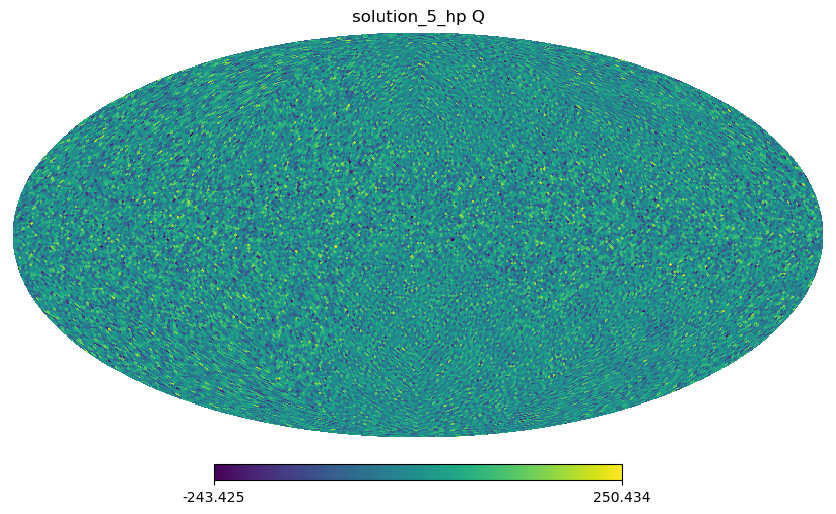

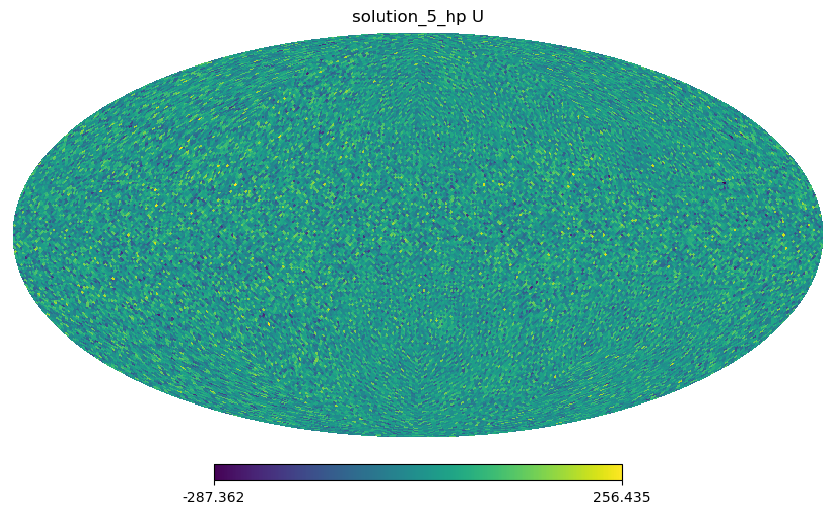

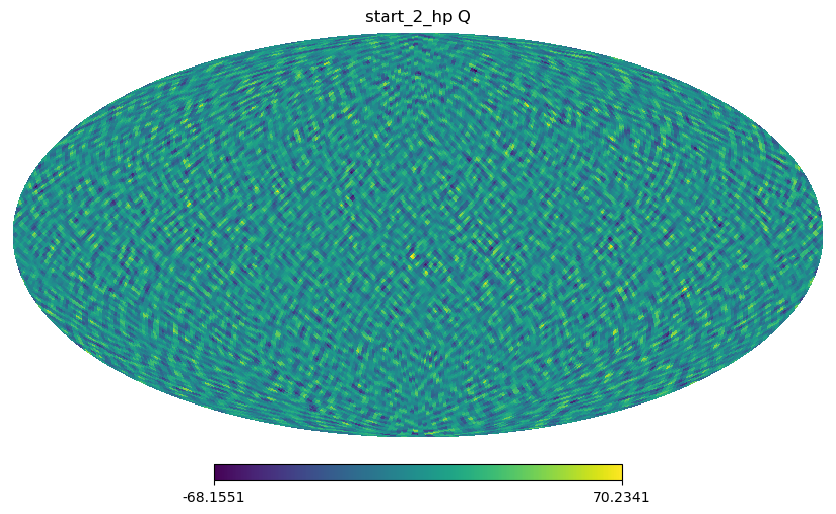

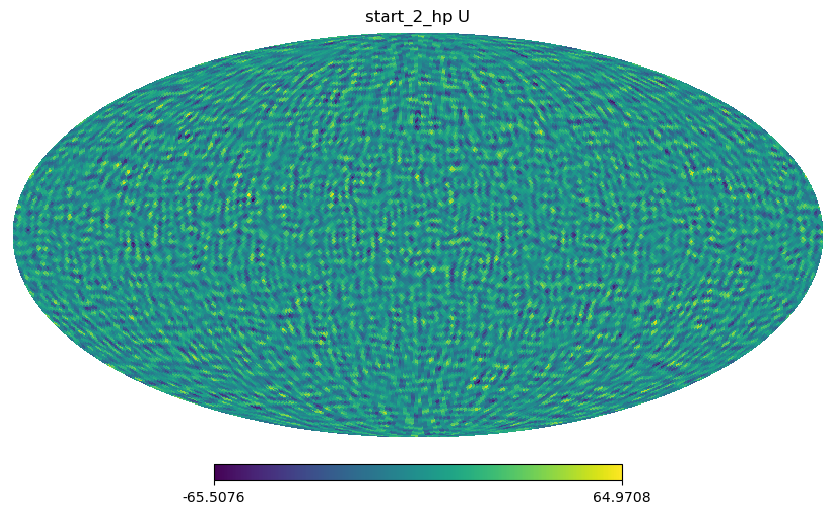

In [203]:
solution_5_hp = solution_5.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))
start_2_hp = start_2.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))
start_hp = start.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))

hp.mollview(solution_5_hp[0], title='solution_5_hp Q')
hp.mollview(solution_5_hp[1], title='solution_5_hp U')
hp.mollview(start_2_hp[0], title='start_2_hp Q')
hp.mollview(start_2_hp[1], title='start_2_hp U')

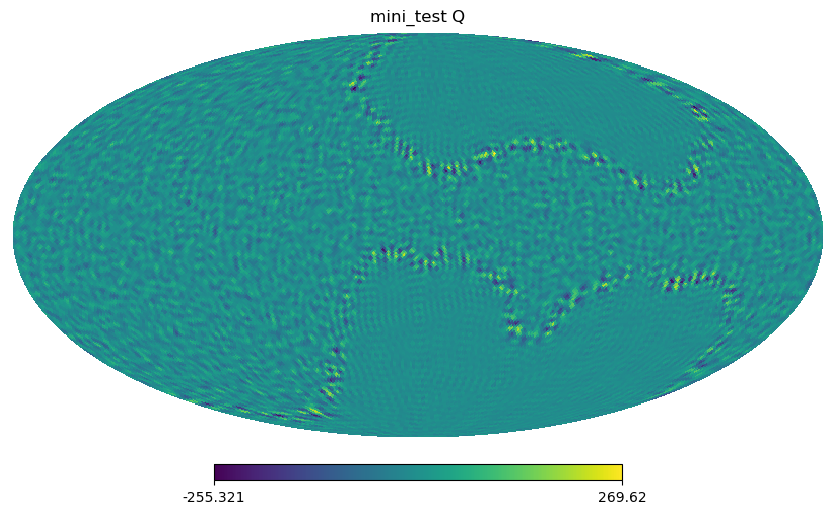

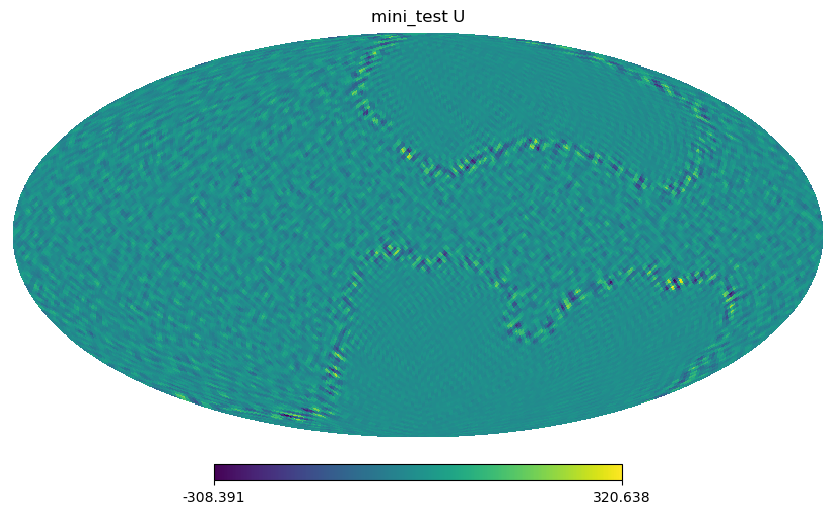

In [226]:
mini_test = true_correction(right_member.ravel()).reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))

hp.mollview(mini_test[0], title='mini_test Q')
hp.mollview(mini_test[1], title='mini_test U')


In [160]:
GMRES_solver = lx.GMRES(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm)
solution_5 = lx.linear_solve(func_lineax_test, right_member.ravel(), solver=GMRES_solver, throw=False)
solution_5.stats


{'max_steps': 1500, 'num_steps': Array(16, dtype=int64)}

In [ ]:
func = lambda x: x.ravel() + first_part_term_left(second_term_left(first_part_term_left(x)))

noise_harmonic = micmac.get_Cl_noise_JAX(np.array(instrument['depth_p']), mixing_matrix_sampled, lmax)
red_noise_c_ell = micmac.get_reduced_matrix_from_c_ell_jax(jnp.array([noise_harmonic[0,0], noise_harmonic[0,0], jnp.zeros_like(noise_harmonic[0,0])]))[lmin:]

red_inverse = jnp.linalg.pinv(jnp.eye(nstokes) + jnp.einsum('lij,ljk->lik', red_cov_matrix_sample, red_noise_c_ell))

precond_func = lambda x: (micmac.maps_x_red_covariance_cell_JAX(x.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix)), red_inverse, nside=MICMAC_sampler_obj.nside, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter)*mask).ravel()

precond_lineax = lx.FunctionLinearOperator(precond_func, jax.ShapeDtypeStruct((MICMAC_sampler_obj.nstokes*MICMAC_sampler_obj.npix,),jnp.float64), tags=(lx.symmetric_tag,lx.positive_semidefinite_tag))
options_dict = {"preconditioner":precond_lineax}

In [ ]:
GMRES_solver = lx.GMRES(rtol=MICMAC_sampler_obj.tolerance_CG, atol=MICMAC_sampler_obj.atol_CG, max_steps=MICMAC_sampler_obj.limit_iter_cg, norm=func_norm)
solution_5 = lx.linear_solve(func_lineax_test, s_cML.ravel(), solver=GMRES_solver, throw=False, options=options_dict)
solution_5.stats


{'max_steps': 200, 'num_steps': Array(200, dtype=int64)}

In [ ]:
# solution_3_lineax = solution_3.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))
# solution_4_lineax = solution_4.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))
solution_5_lineax = solution_5.value.reshape((MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix))

In [37]:
# state = GMRES_solver.init(func_lineax_test, options={})
# solution_2 = lx.linear_solve(func_lineax_test, s_cML.ravel(), solver=GMRES_solver, state=solution_3.state, throw=False)


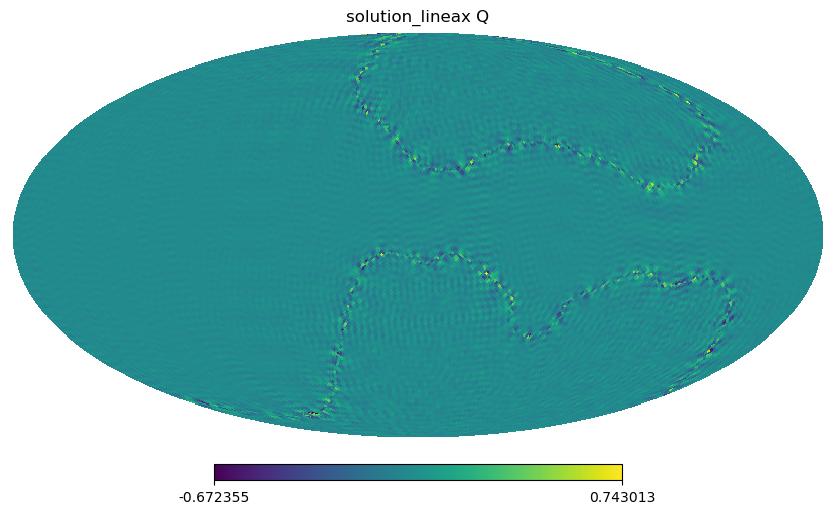

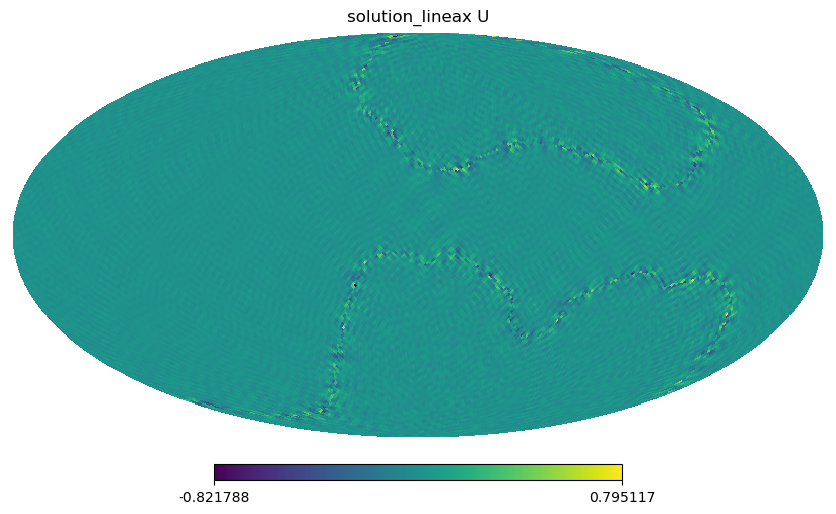

In [38]:
hp.mollview(solution_lineax[0], title='solution_lineax Q')
hp.mollview(solution_lineax[1], title='solution_lineax U')

In [39]:
# hp.mollview(solution_3_lineax[0], title='solution_lineax 3 Q')
# hp.mollview(solution_3_lineax[1], title='solution_lineax 3 U')
# hp.mollview(solution_4_lineax[0], title='solution_lineax 4 Q')
# hp.mollview(solution_4_lineax[1], title='solution_lineax 4 U')


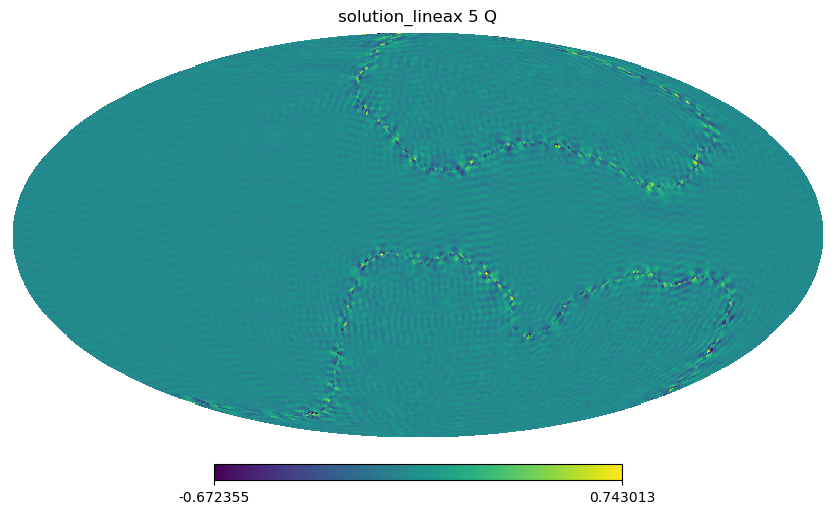

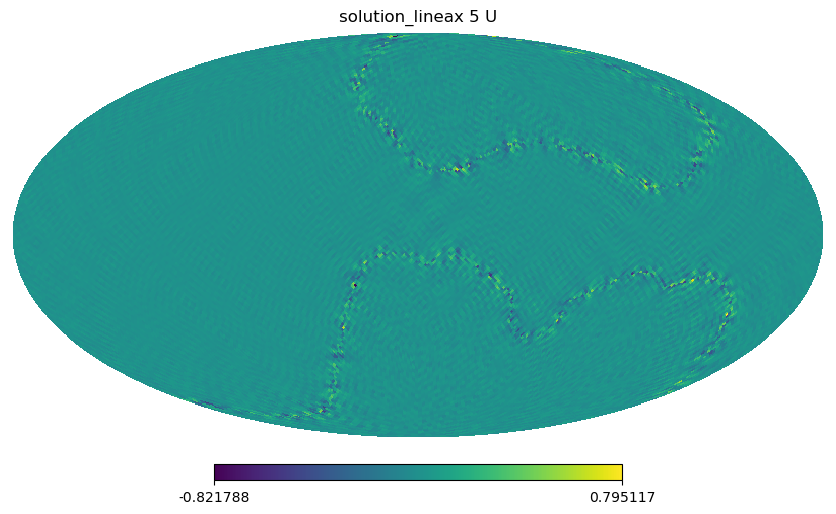

In [40]:
hp.mollview(solution_5_lineax[0], title='solution_lineax 5 Q')
hp.mollview(solution_5_lineax[1], title='solution_lineax 5 U')

In [37]:
MICMAC_sampler_obj.tolerance_CG = 1e-6
# MICMAC_sampler_obj.limit_iter_cg = 2000

In [23]:
%%time
PRNGKey = random.PRNGKey(0)
map_random_realization_xi = None
map_random_realization_chi = None
fluctuation_maps_v2c = MICMAC_sampler_obj.get_fluctuating_term_maps_v2c(red_cov_matrix_sample, BtinvNB, BtinvN_sqrt, PRNGKey, 
                                                                        map_random_realization_xi=map_random_realization_xi, map_random_realization_chi=map_random_realization_chi, 
                                                                        initial_guess=jnp.empty(0))


Recalculating xi !
Recalculating chi !
CG Fluct finished in  10.60972809791565 seconds !!
CG-Python-0 Fluct finished with  lineax._solution.RESULTS<The maximum number of solver steps was reached. Try increasing `max_steps`.> {'max_steps': 200, 'num_steps': Array(200, dtype=int64)}
CPU times: user 1min 4s, sys: 7.59 s, total: 1min 11s
Wall time: 14 s


In [24]:
jitted_get_fluctuating_term_maps_v2c = jax.jit(MICMAC_sampler_obj.get_fluctuating_term_maps_v2c)

In [25]:
# %%time
# PRNGKey = random.PRNGKey(0)
# map_random_realization_xi = None
# map_random_realization_chi = None
# # fluctuation_maps_v2 = get_fluctuating_term_maps_v2(red_cov_matrix_sample, BtinvNB, BtinvN_sqrt, PRNGKey, map_random_realization_xi=map_random_realization_xi, map_random_realization_chi=map_random_realization_chi, initial_guess=jnp.empty(0))
# fluctuation_maps_v2c = jitted_get_fluctuating_term_maps_v2c(red_cov_matrix_sample, BtinvNB, BtinvN_sqrt, PRNGKey, 
#                                                                         map_random_realization_xi=map_random_realization_xi, map_random_realization_chi=map_random_realization_chi, 
#                                                                         initial_guess=jnp.empty(0))
# # fluctuation_maps_v2 = get_fluctuating_term_maps_v2(MICMAC_sampler_obj, red_cov_matrix_sample, BtinvNB, BtinvN_sqrt, PRNGKey, map_random_realization_xi=map_random_realization_xi, map_random_realization_chi=map_random_realization_chi, initial_guess=jnp.empty(0))


In [26]:
%%time
wiener_filter_term_v2c = MICMAC_sampler_obj.solve_generalized_wiener_filter_term_v2c(s_cML, red_cov_matrix_sample, BtinvNB, initial_guess=jnp.empty(0))


CG-Python-0 Fluct finished with  lineax._solution.RESULTS<The maximum number of solver steps was reached. Try increasing `max_steps`.> {'max_steps': 200, 'num_steps': Array(200, dtype=int64)}
CPU times: user 56.1 s, sys: 6.98 s, total: 1min 3s
Wall time: 11.6 s


In [27]:
jitted_solve_generalized_wiener_filter_term_v2c = jax.jit(MICMAC_sampler_obj.solve_generalized_wiener_filter_term_v2c)

In [28]:
# %%time
# wiener_filter_term_v2c = jitted_solve_generalized_wiener_filter_term_v2c(s_cML, red_cov_matrix_sample, BtinvNB, initial_guess=jnp.empty(0))


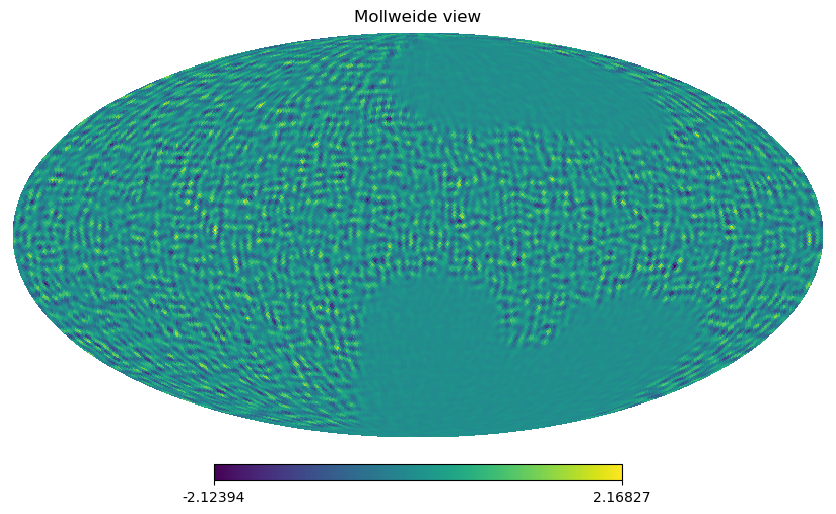

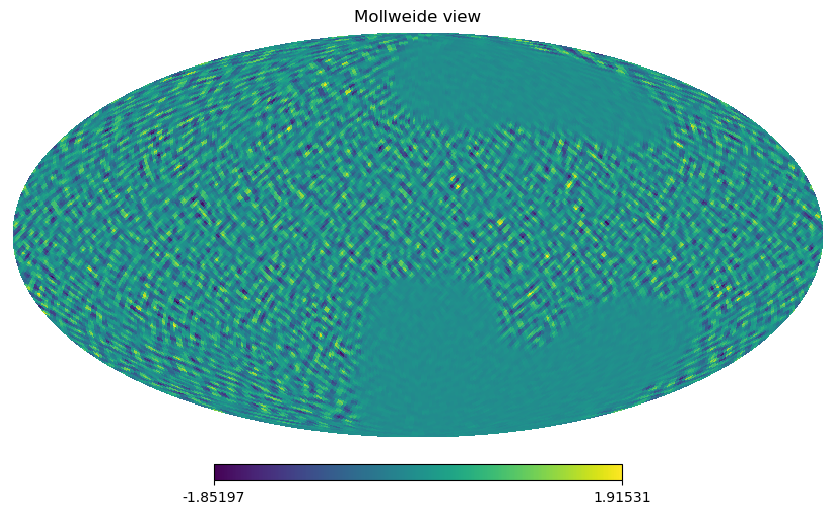

In [29]:
hp.mollview(fluctuation_maps_v2c[0])
hp.mollview(fluctuation_maps_v2c[1])

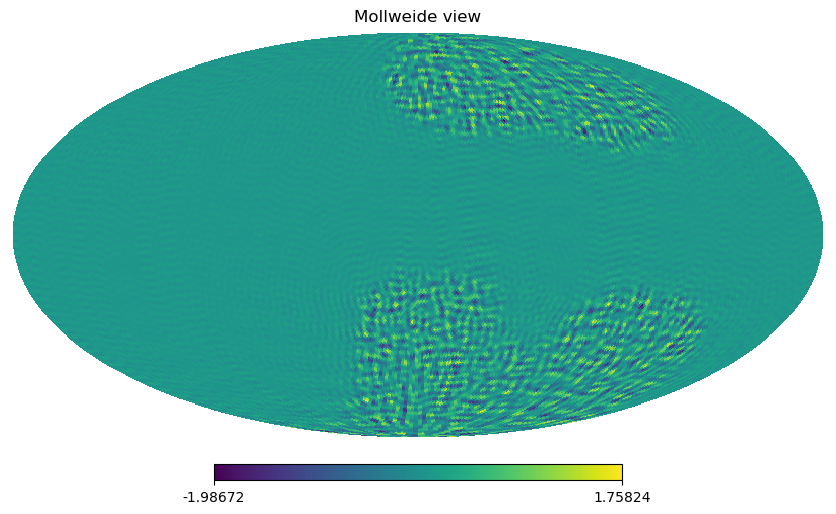

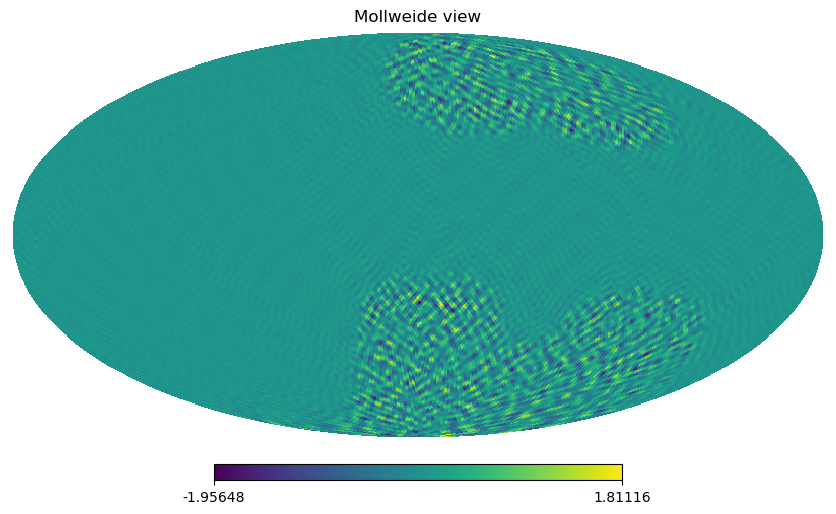

In [30]:
hp.mollview(wiener_filter_term_v2c[0])
hp.mollview(wiener_filter_term_v2c[1])

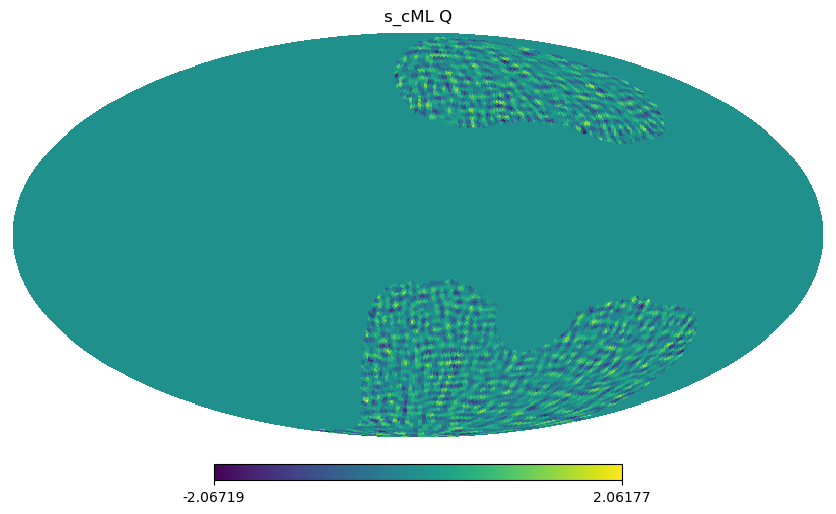

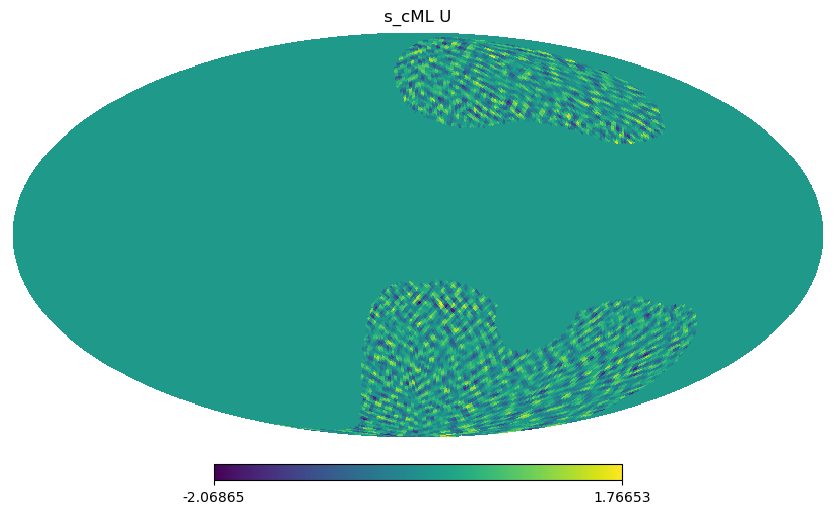

In [31]:
hp.mollview(s_cML[0], title='s_cML Q')
hp.mollview(s_cML[1], title='s_cML U')

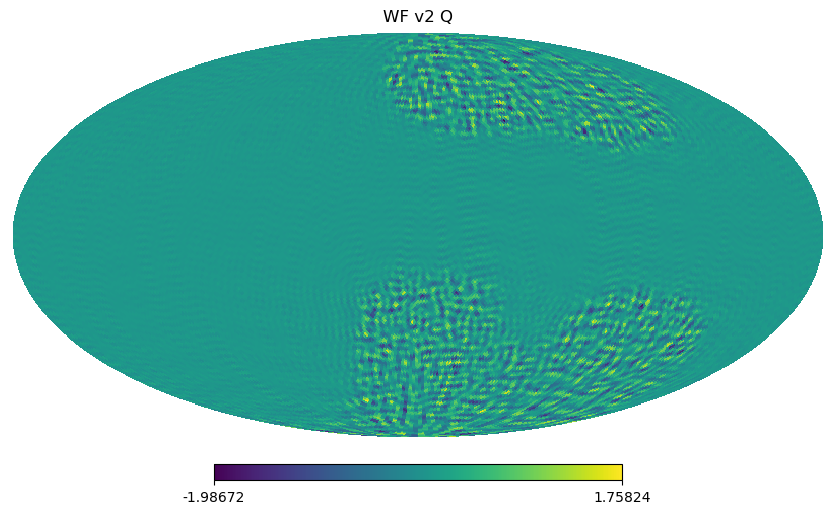

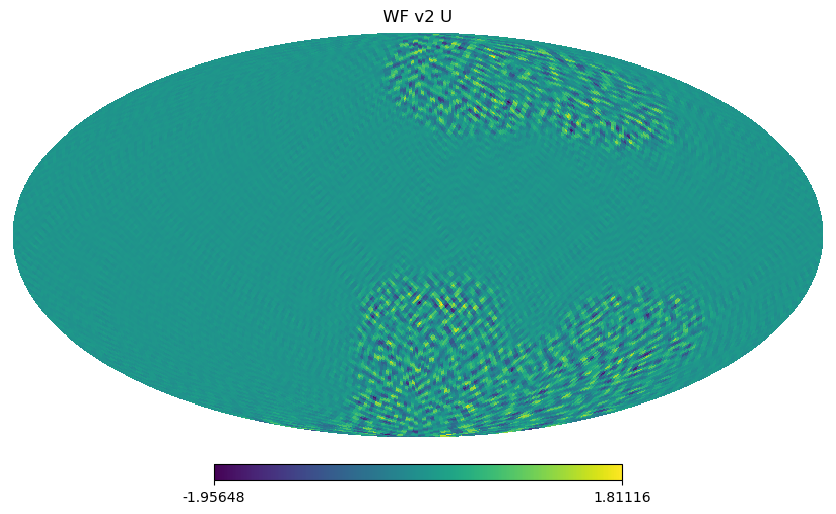

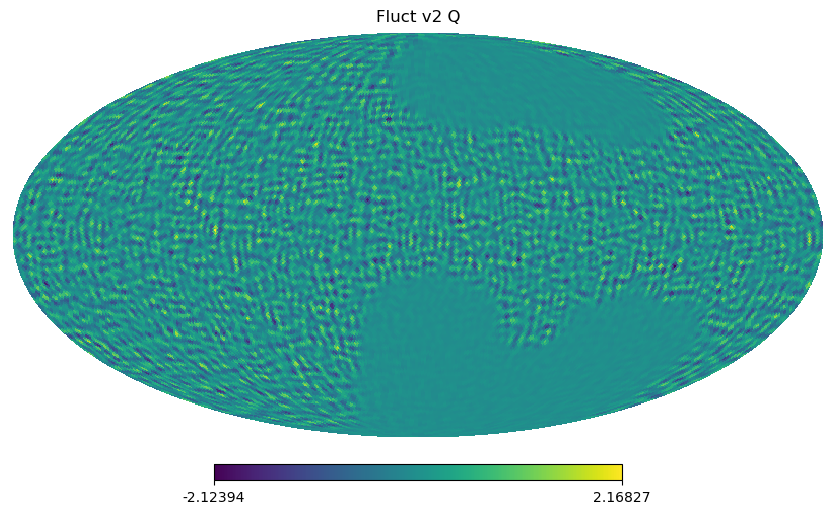

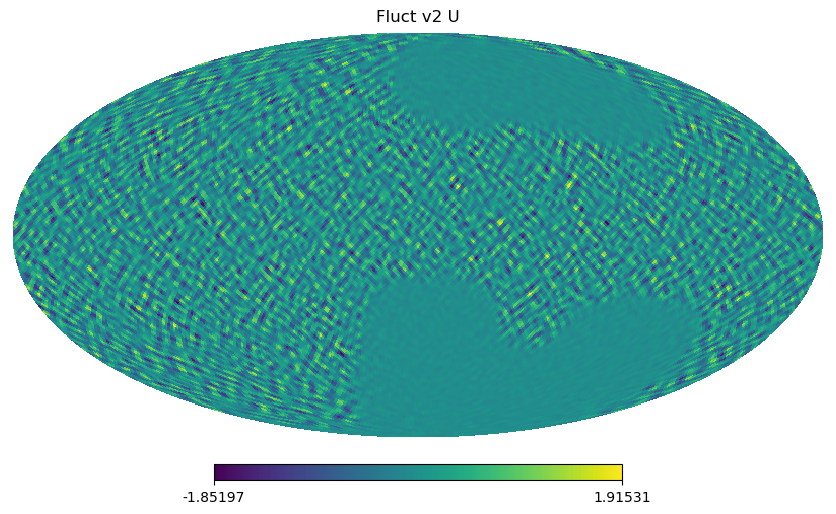

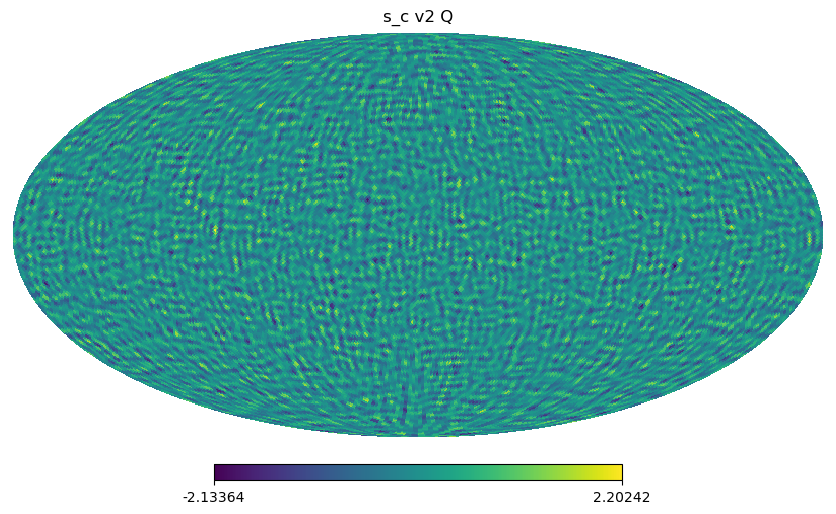

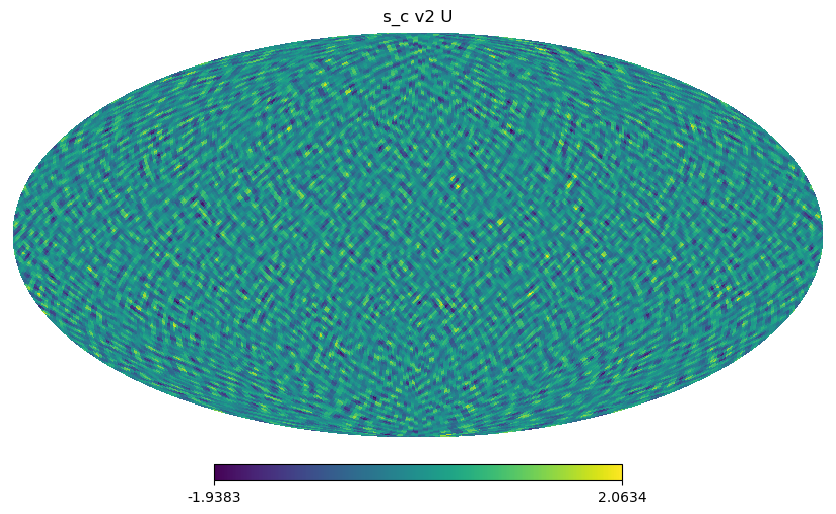

In [32]:
hp.mollview(wiener_filter_term_v2c[0], title='WF v2 Q')
hp.mollview(wiener_filter_term_v2c[1], title='WF v2 U')

hp.mollview(fluctuation_maps_v2c[0], title='Fluct v2 Q')
hp.mollview(fluctuation_maps_v2c[1], title='Fluct v2 U')

hp.mollview((wiener_filter_term_v2c+fluctuation_maps_v2c)[0], title='s_c v2 Q')
hp.mollview((wiener_filter_term_v2c+fluctuation_maps_v2c)[1], title='s_c v2 U')

In [33]:
number_correl_to_plot = int(np.ceil(nstokes**2/2) + np.floor(nstokes/2))

if nstokes == 3:
    number_subplots_convention = 421
    figsize = (10,10)
    figsize_big = (12,12)
    position_legend = int(number_correl_to_plot/2)-1
    bbox_to_anchor=(2.2, 1)
elif nstokes == 2:
    number_subplots_convention = 131
    figsize = (14,6)
    figsize_big = figsize
    position_legend = number_correl_to_plot-1
    bbox_to_anchor=(1, 1)
else:
    number_subplots_convention = 111
    figsize = (10,10)
    figsize_big = (10,10)
    position_legend = int(number_correl_to_plot/2)-1
    bbox_to_anchor=(2.2, 1)

In [34]:
_cl_noise_harm = micmac.get_Cl_noise(np.array(instrument['depth_p']), mixing_matrix_sampled, lmax)[0,0,lmin:]
red_cl_noise_harm = micmac.get_reduced_matrix_from_c_ell(np.array([_cl_noise_harm,_cl_noise_harm,np.zeros_like(_cl_noise_harm)]))
cl_noise_harm = micmac.get_c_ells_from_red_covariance_matrix(red_cl_noise_harm)

In [35]:
fsky = mask.sum()/mask.size
fsky = 1#mask.sum()/mask.size

/Users/mag/miniconda3/envs/non_param_silver/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 
  fig.canvas.print_figure(bytes_io, **kw)


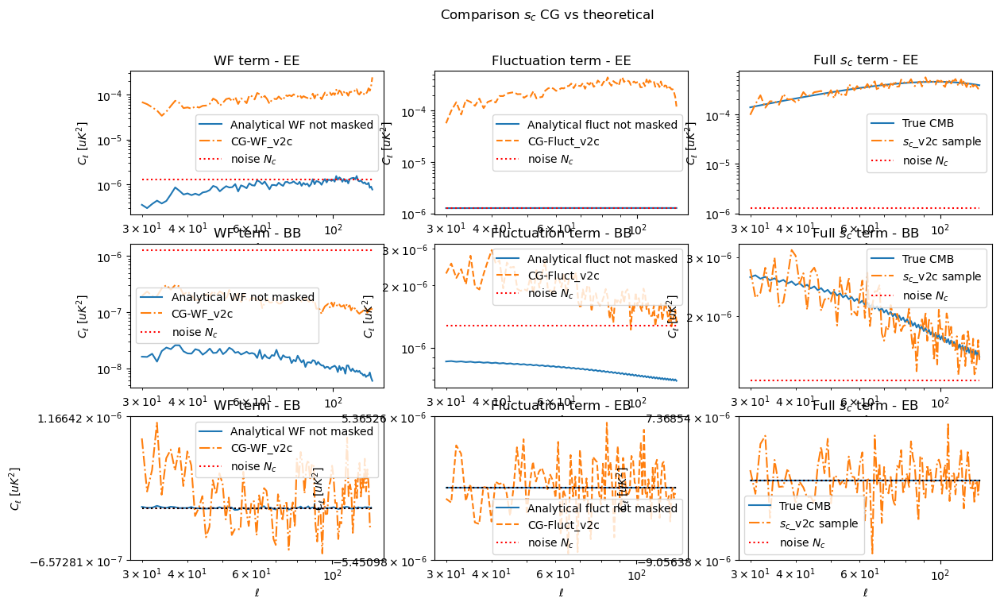

In [36]:
list_correl = ['EE', 'BB', 'EB']

c_ell_true_CMB = micmac.get_c_ells_from_red_covariance_matrix(theoretical_red_cov_r0_total + MICMAC_sampler_obj.r_true * theoretical_red_cov_r1_tensor)

covariance_noise = np.zeros_like(c_ell_true_CMB)

# analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix_sample) + np.eye(nstokes)/BtinvNB[0,0])
# # analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix) + eye_Stokes_only_B/BtinvNB[0,0])
# analytical_WF_map = micmac.maps_x_reduced_matrix_generalized_sqrt_sqrt(s_cML/BtinvNB[0,0], analytical_WF_harm, lmin=lmin, n_iter=n_iter)
analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix_sample) + np.linalg.pinv(red_cl_noise_harm))
# analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix) + eye_Stokes_only_B/BtinvNB[0,0])
N_c_inv = jnp.copy(BtinvNB[0,0])
N_c_inv = N_c_inv.at[...,mask!=0].set(1/BtinvNB[0,0,mask!=0]/jhp.nside2resol(nside)**2)

# analytical_WF_map = micmac.maps_x_reduced_matrix_generalized_sqrt_sqrt(s_cML/BtinvNB[0,0]/hp.nside2resol(MICMAC_sampler_obj.nside)**2,
#                                                                         analytical_WF_harm, lmin=lmin, n_iter=n_iter)

s_cML_unmasked = micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, input_freq_maps, jax_use=False)[0, :, :]
analytical_WF_map = micmac.maps_x_reduced_matrix_generalized_sqrt_sqrt(s_cML_unmasked/BtinvNB[0,0,mask!=0][0]/hp.nside2resol(MICMAC_sampler_obj.nside)**2,
                                                                        analytical_WF_harm, lmin=lmin, n_iter=n_iter)

analytical_WF_map_ext = np.vstack([np.zeros_like(analytical_WF_map[0]),analytical_WF_map])
analytical_WF_cells = hp.anafast(analytical_WF_map_ext, lmax=lmax, iter=n_iter)[indices_polar,lmin:]
analytical_fluct_c_ell = micmac.get_c_ells_from_red_covariance_matrix(analytical_WF_harm.copy())#[indices_polar,lmin:]


s_c_WF_v2c_maps_extended = np.vstack([np.zeros_like(wiener_filter_term_v2c[0,...]), wiener_filter_term_v2c])
c_ells_s_c_WF_v2c = hp.anafast(s_c_WF_v2c_maps_extended, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

s_c_fluct_v2c_maps_extended = np.vstack([np.zeros_like(fluctuation_maps_v2c[0,...]), fluctuation_maps_v2c])
c_ells_s_c_fluct_v2c = hp.anafast(s_c_fluct_v2c_maps_extended, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

s_c_sample_v2c = wiener_filter_term_v2c + fluctuation_maps_v2c
s_c_v2c_recovered_ext = np.vstack([np.zeros_like(s_c_sample_v2c[0]),s_c_sample_v2c])
c_ells_s_c_v2c = hp.anafast(s_c_v2c_recovered_ext, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

plt.figure(figsize=(14,8))
plt.suptitle(r"Comparison $s_c$ CG vs theoretical")

for j in range(number_correl_to_plot):
    plt.subplot(331+3*j)
    plt.plot(np.arange(c_ells_s_c_WF_v2c.shape[-1])+lmin, analytical_WF_cells[j,:], label='Analytical WF not masked')
    plt.plot(np.arange(c_ells_s_c_WF_v2c.shape[-1])+lmin, c_ells_s_c_WF_v2c[j,:]/fsky, '-.', label='CG-WF_v2c')
    plt.plot(np.arange(c_ells_s_c_WF_v2c.shape[-1])+MICMAC_sampler_obj.lmin, cl_noise_harm[j,:], 'r:', label='noise $N_c$')
    if j <= nstokes-1:
        plt.loglog()
    else:
        plt.xscale('log')
        plt.yscale('symlog')
        plt.plot([lmin,lmax+1], [0,0], 'k:')
    plt.title('WF term - {}'.format(list_correl[j]))
    plt.ylabel("$C_\ell$ [$uK^2$]")
    plt.xlabel(r"$\ell$")
    plt.legend()

    plt.subplot(332+3*j)
    plt.plot(np.arange(c_ells_s_c_fluct_v2c.shape[-1])+lmin, analytical_fluct_c_ell[j,:], label='Analytical fluct not masked')
    plt.plot(np.arange(c_ells_s_c_fluct_v2c.shape[-1])+lmin, c_ells_s_c_fluct_v2c[j,:]/fsky, '--', label='CG-Fluct_v2c')
    plt.plot(np.arange(c_ells_s_c_fluct_v2c.shape[-1])+MICMAC_sampler_obj.lmin, cl_noise_harm[j,:], 'r:', label='noise $N_c$')

    if j <= nstokes-1:
        plt.loglog()
    else:
        plt.xscale('log')
        plt.yscale('symlog')
        plt.plot([lmin,lmax+1], [0,0], 'k:')
    plt.title('Fluctuation term - {}'.format(list_correl[j]))
    plt.ylabel("$C_\ell$ [$uK^2$]")
    plt.xlabel(r"$\ell$")
    plt.legend()
    
    plt.subplot(333+3*j)
    plt.plot(np.arange(c_ells_s_c_v2c.shape[-1])+lmin, c_ell_true_CMB[j,:], label='True CMB')
    plt.plot(np.arange(c_ells_s_c_v2c.shape[-1])+lmin, c_ells_s_c_v2c[j,:]/fsky, '-.', label='$s_c$_v2c sample')
    plt.plot(np.arange(c_ells_s_c_v2c.shape[-1])+MICMAC_sampler_obj.lmin, cl_noise_harm[j,:], 'r:', label='noise $N_c$')

    if j <= nstokes-1:
        plt.loglog()
        plt.plot([lmin,lmax+1], [0,0], 'k:')
    else:
        plt.xscale('log')
        plt.yscale('symlog')
        plt.plot([lmin,lmax+1], [0,0], 'k:')
    plt.title('Full $s_c$ term - {}'.format(list_correl[j]))
    plt.ylabel("$C_\ell$ [$uK^2$]")
    
    plt.xlabel(r"$\ell$")
    plt.legend()


plt.show()